In [0]:
import zipfile
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

**Uncomment this file if you have uploaded the data file on google drive**


In [2]:
# # only use if your data is present on google drive
# from google.colab import drive
# drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


**Use this code if you are using the zip file.**

In [0]:
# # Extracting the .zip file data to your current directory 
# file_path = 'drive/My Drive/creditcardfraud.zip' 
# zfile = zipfile.ZipFile(file_path)
# zfile.extractall('')

**This notebook assumes that you are having creditcard.csv file in your directory.
This notebook assumes that you are having creditcard.csv file in your directory.
The file is too long to upload on github.**

Download it from- 
https://www.kaggle.com/mlg-ulb/creditcardfraud

In [4]:
df = pd.read_csv('creditcard.csv')
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [5]:
# Separating the X and y values from csv file
X = df.iloc[:,0:-1]
y = df.iloc[:,-1].values.ravel()
y

array([0, 0, 0, ..., 0, 0, 0])

In [6]:
# Taking out the fraud values 
fraud = df.loc[df['Class'] == 1]
len(fraud)

492

In [7]:
# Taking out the not fraud values 
non_fraud = df.loc[df['Class'] == 0]
len(non_fraud)

284315

In [8]:
df.shape

(284807, 31)

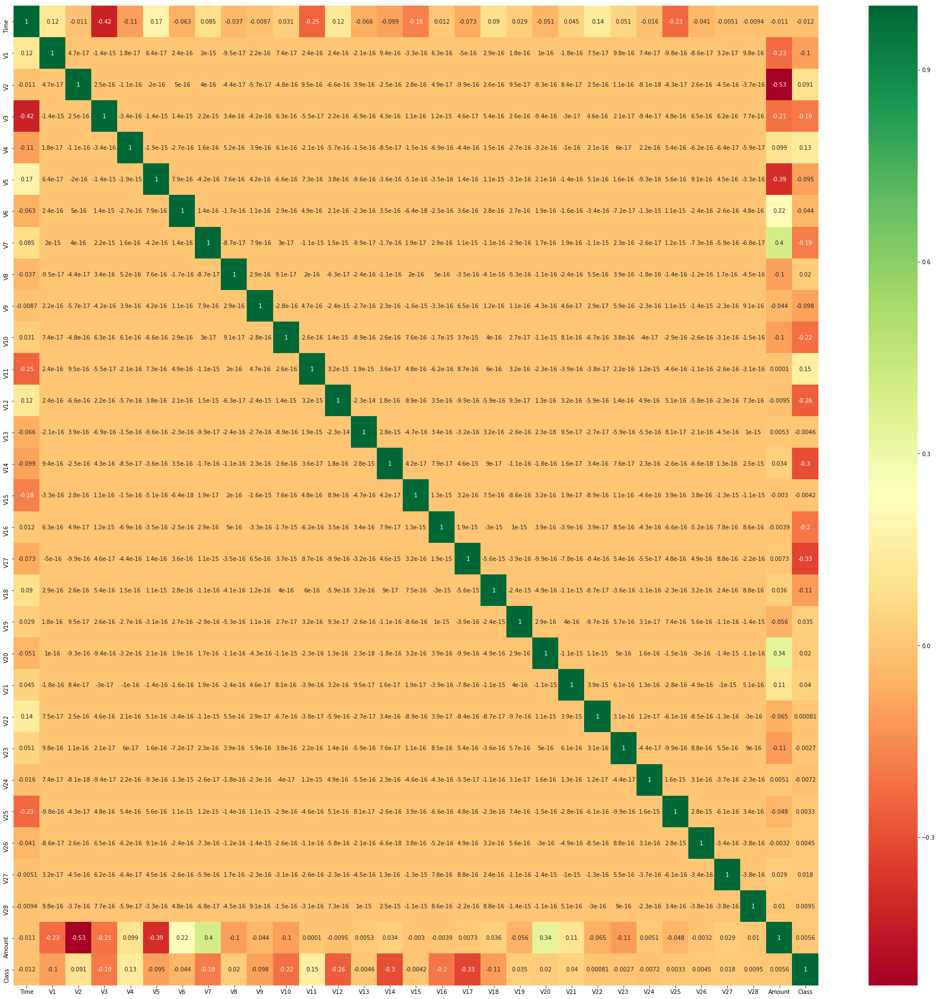

In [9]:
plt.figure(figsize=(32,32))
#plotting heat map to see the coorelation
sns.heatmap(df.corr(),annot=True,cmap="RdYlGn")

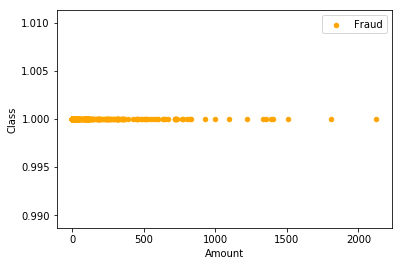

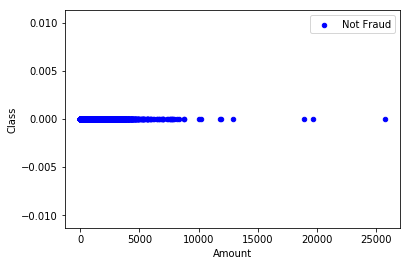

In [14]:
# Plotting the fraud and non fraud data
fraud.plot.scatter(x = 'Amount', y = 'Class', color = 'Orange', label = 'Fraud')
non_fraud.plot.scatter(x= 'Amount', y = 'Class', color = 'Blue', label = 'Not Fraud')
plt.show()

In [15]:
X.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99


In [0]:
# standardizing the dimensions with sklearn standard scaler, not including the time column
standard_scaler = StandardScaler()
X_subset = standard_scaler.fit_transform(X.iloc[:,1:])
X_subset.shape
X_subset = pd.DataFrame(X_subset, columns=X.columns[1:])

In [0]:
X = pd.concat([X.iloc[:,0], X_subset], axis = 1)

In [0]:
# Splitting the trainig and testing data using train test split.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.25, random_state = 0)

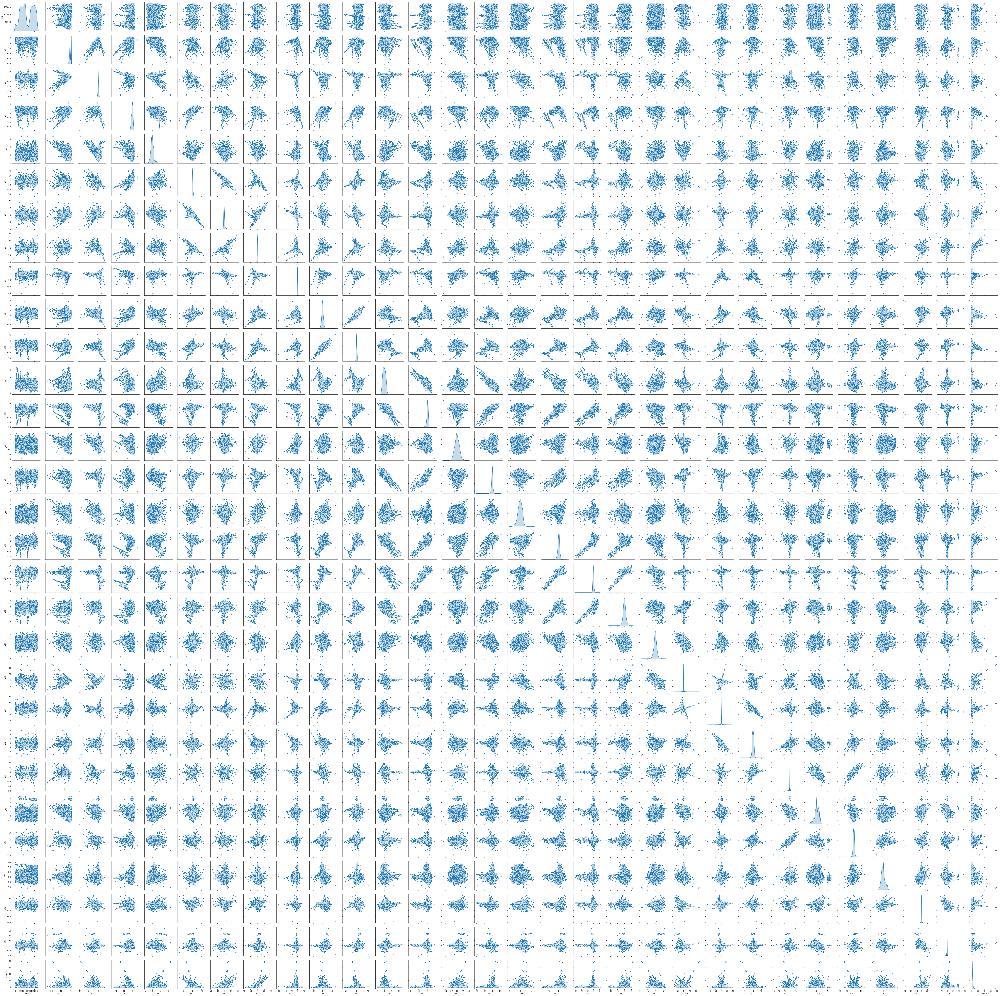

In [19]:
sns.pairplot(X_train, diag_kind="kde")
plt.show()

In [20]:
# Using Logistic Regression classifier with cross validation score and printing the confusion matrix
log_clf = LogisticRegression(random_state=0)
log_clf.fit(X_train, y_train)
score = cross_validate(log_clf, X_train, y_train, cv = 10)
print('The score of cross validation is {}'.format(score))
y_pred = log_clf.predict(X_test)
confusion_matrix(y_test, y_pred)

The score of cross validation is {'fit_time': array([2.61946368, 2.34347892, 2.67081594, 2.66895723, 2.33475447,
       2.6717205 , 2.66451383, 2.66393805, 2.65602088, 2.66708064]), 'score_time': array([0.00720263, 0.0042572 , 0.00429416, 0.00428963, 0.00427437,
       0.00419569, 0.00448656, 0.00431538, 0.00429726, 0.00428081]), 'test_score': array([0.99906376, 0.99887651, 0.9986892 , 0.9991573 , 0.99873596,
       0.99920412, 0.99906367, 0.99920412, 0.99892322, 0.99897004])}


array([[71058,    24],
       [   42,    78]])

In [21]:
# Using Support vector machine classifier with cross validation score and printing the confusion matrix
svc_clf = SVC()
svc_clf.fit(X_train, y_train)
score = cross_validate(log_clf, X_train, y_train, cv = 10)
print('The score of cross validation is {}'.format(score))
y_pred = svc_clf.predict(X_test)
confusion_matrix(y_test, y_pred)

The score of cross validation is {'fit_time': array([2.55725574, 2.68848491, 2.59334445, 2.60408902, 2.25574613,
       2.71004462, 2.63414693, 2.60233998, 2.78765392, 2.65512085]), 'score_time': array([0.00511837, 0.00436306, 0.00432706, 0.00429964, 0.00425911,
       0.00509095, 0.00468969, 0.00425887, 0.00421739, 0.00505614]), 'test_score': array([0.99906376, 0.99887651, 0.9986892 , 0.9991573 , 0.99873596,
       0.99920412, 0.99906367, 0.99920412, 0.99892322, 0.99897004])}


array([[71082,     0],
       [  117,     3]])

In [22]:
# Using Decision tree classifier with cross validation score and printing the confusion matrix
dt_clf = DecisionTreeClassifier()
dt_clf.fit(X_train, y_train)
score = cross_validate(dt_clf, X_train, y_train, cv = 10)
print('The score of cross validation is {}'.format(score))
y_pred = svc_clf.predict(X_test)
confusion_matrix(y_test, y_pred)

The score of cross validation is {'fit_time': array([21.31305552, 16.63943243, 16.46666837, 19.33326459, 16.55334282,
       16.07250476, 17.94019032, 17.97881651, 21.71015358, 20.98968267]), 'score_time': array([0.00617051, 0.00588512, 0.00576735, 0.00602889, 0.00592208,
       0.00596905, 0.00598216, 0.00587368, 0.00629139, 0.0064671 ]), 'test_score': array([0.99925101, 0.99934463, 0.99892327, 0.99920412, 0.99939139,
       0.99925094, 0.99925094, 0.99934457, 0.99906367, 0.99920412])}


array([[71082,     0],
       [  117,     3]])

In [23]:
# Using Random forest classifier with cross validation score and printing the confusion matrix
rf_clf = RandomForestClassifier(n_estimators=40)
rf_clf.fit(X_train, y_train)
score = cross_validate(rf_clf, X_train, y_train, cv = 10)
print('The score of cross validation is {}'.format(score))
y_pred = svc_clf.predict(X_test)
confusion_matrix(y_test, y_pred)

The score of cross validation is {'fit_time': array([70.54354548, 77.41798568, 72.93393183, 77.97662234, 75.97939539,
       74.41224885, 75.19840956, 76.76658559, 75.82184863, 77.4087317 ]), 'score_time': array([0.08738399, 0.09214354, 0.08812213, 0.0896318 , 0.08933997,
       0.08893323, 0.09147167, 0.0887332 , 0.09082365, 0.09000683]), 'test_score': array([0.99939144, 0.99967232, 0.99920416, 0.99967228, 0.99953184,
       0.9997191 , 0.9994382 , 0.99953184, 0.99962547, 0.99939139])}


array([[71082,     0],
       [  117,     3]])

***By seeing the confusion matrix of differnt models we can see that Logistic Regression Classifier will be the best choise to detect fraud choice.***